# Notebook 26 — Modèle couleur : segmentation non supervisée (K-means CIELAB + SLIC)

## Objectif

Partitionner chaque image en **N régions de couleur homogène**, sans annotation, pour donner à la branche couleur du pipeline une sortie **structurée** (régions) au lieu d'une simple valeur de luminance par pixel.

## Choix méthodologiques et justification

**1. Espace couleur : CIELAB, pas RGB**

Le RGB n'est pas perceptuellement uniforme : une distance euclidienne dans RGB ne correspond pas à une différence de couleur perçue. CIELAB a été conçu pour que la distance euclidienne ≈ différence perçue — c'est l'espace standard pour le clustering de couleurs.
- `L*` = clarté (0–100) → directement lié à l'albédo
- `a*`, `b*` = chromaticité (vert↔rouge, bleu↔jaune)

**2. Deux méthodes complémentaires**

| Méthode | Principe | Avantage | Limite |
|---|---|---|---|
| **K-means sur CIELAB** | regroupe les pixels par similarité colorimétrique, sans contrainte spatiale | palette globale, régions cohérentes même dispersées | régions fragmentées, bruit pixel |
| **SLIC + fusion** | superpixels spatialement compacts, puis regroupement par couleur moyenne | régions **spatialement cohérentes**, respect des contours | dépend de la taille de superpixel |

Les deux sont calculées : SLIC pour la lisibilité visuelle, K-means pour la palette quantitative.

**3. Palette globale (dataset) plutôt que par image**

Un K-means par image donne des couleurs différentes d'une image à l'autre → impossible de comparer. On construit donc **une palette unique apprise sur l'ensemble des 116 images**, puis on l'applique à chacune. Les régions deviennent comparables entre images.

## Sorties

1. Palette de N couleurs apprise sur le dataset (valeurs Lab + RGB + luminance)
2. Carte de segmentation couleur par image (`.png`, indices de cluster)
3. Croisement **couleur × classe sémantique** : quelles couleurs dominent route / trottoir / façade
4. Export réutilisable dans le nb25 pour moduler l'albédo par **couleur de région** au lieu de luminance brute par pixel

## 1. Environnement + chemins

In [1]:
import time, random
from pathlib import Path

import numpy as np
import cv2
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import silhouette_score
from skimage.segmentation import slic
from skimage.color import rgb2lab, lab2rgb

PROJECT_ROOT = Path("..").resolve()
DATASET_DIR   = PROJECT_ROOT / "data" / "outputs" / "dataset_coolpath_360"
IMG_DIR       = DATASET_DIR / "images"
LBL_DIR       = DATASET_DIR / "labels"
SEM_MASKS_DIR = PROJECT_ROOT / "data" / "outputs" / "fusion_3models_v2" / "masks_semantic"

OUTPUT_DIR  = PROJECT_ROOT / "data" / "outputs" / "color_segmentation"
KMEANS_DIR  = OUTPUT_DIR / "masks_kmeans"     # indices de cluster (PNG)
SLIC_DIR    = OUTPUT_DIR / "masks_slic"
VIZ_DIR     = OUTPUT_DIR / "viz"
for d in (OUTPUT_DIR, KMEANS_DIR, SLIC_DIR, VIZ_DIR):
    d.mkdir(parents=True, exist_ok=True)

assert IMG_DIR.exists(), f"Dataset introuvable : {IMG_DIR} (nb23)"
image_paths = sorted(list(IMG_DIR.glob("*.jpg")) + list(IMG_DIR.glob("*.png")))
print(f"{len(image_paths)} images")

CITYSCAPES_ORDER = [
    "road", "sidewalk", "building", "wall", "fence", "pole", "traffic_light",
    "traffic_sign", "vegetation", "terrain", "sky", "person", "rider",
    "car", "truck", "bus", "train", "motorcycle", "bicycle",
]

def load_sem(stem):
    f = SEM_MASKS_DIR / f"{stem}_sem.png"
    if f.exists():
        return cv2.imread(str(f), cv2.IMREAD_GRAYSCALE)
    return np.array(Image.open(LBL_DIR / f"{stem}.png"))

116 images


## 2. Échantillonnage des pixels du dataset

Pour apprendre la palette globale sans charger 116 images entières en mémoire, on échantillonne aléatoirement `N_SAMPLE_PER_IMG` pixels par image, convertis en CIELAB.

In [2]:
N_SAMPLE_PER_IMG = 20000
rng = np.random.default_rng(42)

samples = []
for i, p in enumerate(image_paths, 1):
    bgr = cv2.imread(str(p))
    if bgr is None:
        continue
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB).astype(np.float64) / 255.0
    lab = rgb2lab(rgb).reshape(-1, 3)
    idx = rng.choice(lab.shape[0], size=min(N_SAMPLE_PER_IMG, lab.shape[0]), replace=False)
    samples.append(lab[idx])
    if i % 20 == 0 or i == len(image_paths):
        print(f"[{i}/{len(image_paths)}] echantillonnage...")

X = np.vstack(samples)
print(f"\n{X.shape[0]:,} pixels echantillonnes (CIELAB)")
print(f"  L* : {X[:,0].min():.1f} - {X[:,0].max():.1f}")
print(f"  a* : {X[:,1].min():.1f} - {X[:,1].max():.1f}")
print(f"  b* : {X[:,2].min():.1f} - {X[:,2].max():.1f}")

[20/116] echantillonnage...
[40/116] echantillonnage...
[60/116] echantillonnage...
[80/116] echantillonnage...
[100/116] echantillonnage...
[116/116] echantillonnage...

2,320,000 pixels echantillonnes (CIELAB)
  L* : 0.1 - 100.0
  a* : -62.3 - 71.1
  b* : -95.6 - 89.7


## 3. Choix du nombre de clusters N

Deux critères calculés sur un sous-échantillon :
- **Inertie (méthode du coude)** : somme des distances intra-cluster — décroît toujours, on cherche le « coude »
- **Silhouette** : cohésion vs séparation des clusters (plus haut = mieux, max 1)

Le choix final reste un compromis : trop peu de clusters → couleurs distinctes fusionnées ; trop → sur-segmentation difficile à interpréter.

  k= 4 : inertie=  10,689,525  silhouette=0.384
  k= 6 : inertie=   7,182,048  silhouette=0.376
  k= 8 : inertie=   5,876,967  silhouette=0.329
  k=10 : inertie=   4,600,378  silhouette=0.346
  k=12 : inertie=   4,032,161  silhouette=0.322
  k=16 : inertie=   3,319,014  silhouette=0.303
  k=20 : inertie=   2,760,222  silhouette=0.295


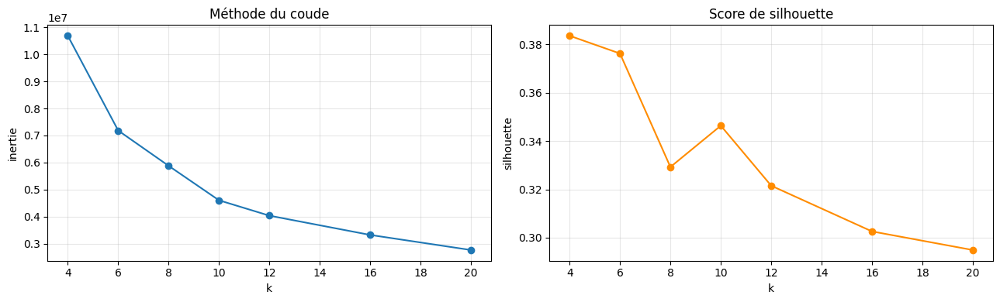


Meilleure silhouette : k=4
-> ajuster N_COLORS ci-dessous selon ces courbes ET la lisibilite souhaitee


In [3]:
K_RANGE = [4, 6, 8, 10, 12, 16, 20]
X_test = X[rng.choice(X.shape[0], size=min(50000, X.shape[0]), replace=False)]

inerties, silhouettes = [], []
for k in K_RANGE:
    km = MiniBatchKMeans(n_clusters=k, random_state=42, n_init=5, batch_size=4096).fit(X_test)
    inerties.append(km.inertia_)
    sub = rng.choice(X_test.shape[0], size=min(10000, X_test.shape[0]), replace=False)
    silhouettes.append(silhouette_score(X_test[sub], km.labels_[sub]))
    print(f"  k={k:>2} : inertie={km.inertia_:>12,.0f}  silhouette={silhouettes[-1]:.3f}")

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].plot(K_RANGE, inerties, "o-"); axes[0].set_xlabel("k"); axes[0].set_ylabel("inertie")
axes[0].set_title("Méthode du coude"); axes[0].grid(alpha=0.3)
axes[1].plot(K_RANGE, silhouettes, "o-", color="darkorange")
axes[1].set_xlabel("k"); axes[1].set_ylabel("silhouette"); axes[1].set_title("Score de silhouette")
axes[1].grid(alpha=0.3)
plt.tight_layout(); fig.savefig(OUTPUT_DIR / "choix_k.png", dpi=150); plt.show()

print(f"\nMeilleure silhouette : k={K_RANGE[int(np.argmax(silhouettes))]}")
print("-> ajuster N_COLORS ci-dessous selon ces courbes ET la lisibilite souhaitee")

## 4. Apprentissage de la palette globale

K-means sur l'ensemble des pixels échantillonnés → une palette de `N_COLORS` couleurs valable pour **tout le dataset**.

 cluster   L*    a*    b*   R   G   B  luminance_0_255
       7 17.9   0.9  -1.1  44  43  45               46
       3 24.8  -8.9  14.8  53  62  36               63
       5 36.5   0.7   0.7  87  85  84               93
       1 42.1 -13.8  24.4  90 104  58              107
       8 53.5   0.7   4.6 132 127 119              136
       0 66.9  -3.3 -27.5 122 166 211              171
       6 71.0 -15.3  32.1 167 180 114              181
       2 74.3   0.7   5.6 188 181 172              189
       9 82.6  -2.7 -17.6 181 208 238              211
       4 93.1  -1.0   3.3 236 235 228              237


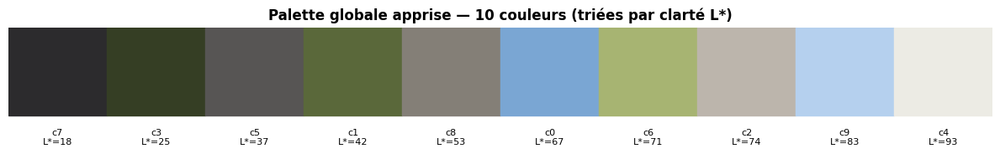

In [4]:
N_COLORS = 10        # <- ajuster selon la section 3

kmeans = KMeans(n_clusters=N_COLORS, random_state=42, n_init=10).fit(X)
palette_lab = kmeans.cluster_centers_
palette_rgb = (np.clip(lab2rgb(palette_lab.reshape(1, -1, 3)), 0, 1)[0] * 255).astype(np.uint8)

df_pal = pd.DataFrame({
    "cluster": range(N_COLORS),
    "L*": palette_lab[:, 0].round(1),
    "a*": palette_lab[:, 1].round(1),
    "b*": palette_lab[:, 2].round(1),
    "R": palette_rgb[:, 0], "G": palette_rgb[:, 1], "B": palette_rgb[:, 2],
    "luminance_0_255": (palette_lab[:, 0] / 100 * 255).round(0).astype(int),
}).sort_values("L*").reset_index(drop=True)
df_pal.to_csv(OUTPUT_DIR / "palette_globale.csv", index=False)
print(df_pal.to_string(index=False))

fig, ax = plt.subplots(figsize=(12, 2))
order = np.argsort(palette_lab[:, 0])
for i, c in enumerate(order):
    ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=palette_rgb[c] / 255.0))
    ax.text(i + 0.5, -0.15, f"c{c}\nL*={palette_lab[c,0]:.0f}",
            ha="center", va="top", fontsize=8)
ax.set_xlim(0, N_COLORS); ax.set_ylim(-0.4, 1); ax.axis("off")
ax.set_title(f"Palette globale apprise — {N_COLORS} couleurs (triées par clarté L*)",
             fontweight="bold")
plt.tight_layout(); fig.savefig(OUTPUT_DIR / "palette_globale.png", dpi=150); plt.show()

## 5. Application aux 116 images

Deux cartes par image :
- **K-means** : chaque pixel reçoit l'indice de la couleur de palette la plus proche (distance CIELAB)
- **SLIC** : superpixels spatialement compacts, chacun assigné à la couleur de palette la plus proche de sa **couleur moyenne** → régions cohérentes, contours respectés

Reprise automatique : les images déjà traitées sont sautées.

In [5]:
SLIC_N_SEGMENTS = 400
SLIC_COMPACTNESS = 10.0

for i, p in enumerate(image_paths, 1):
    f_km, f_sl = KMEANS_DIR / f"{p.stem}_km.png", SLIC_DIR / f"{p.stem}_slic.png"
    if f_km.exists() and f_sl.exists():
        continue
    bgr = cv2.imread(str(p))
    if bgr is None:
        continue
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB).astype(np.float64) / 255.0
    lab = rgb2lab(rgb)
    h, w = lab.shape[:2]

    # --- K-means : plus proche centre de palette, par pixel ---
    d = np.linalg.norm(lab.reshape(-1, 1, 3) - palette_lab[None, :, :], axis=2)
    km_map = np.argmin(d, axis=1).reshape(h, w).astype(np.uint8)
    cv2.imwrite(str(f_km), km_map)

    # --- SLIC : superpixels puis assignation par couleur moyenne ---
    sp = slic(rgb, n_segments=SLIC_N_SEGMENTS, compactness=SLIC_COMPACTNESS,
              start_label=0, channel_axis=-1)
    sl_map = np.zeros((h, w), dtype=np.uint8)
    for s in np.unique(sp):
        m = sp == s
        mean_lab = lab[m].mean(axis=0)
        sl_map[m] = int(np.argmin(np.linalg.norm(palette_lab - mean_lab, axis=1)))
    cv2.imwrite(str(f_sl), sl_map)

    if i % 10 == 0 or i == len(image_paths):
        print(f"[{i}/{len(image_paths)}] {p.name}")

print(f"\nK-means : {KMEANS_DIR}\nSLIC    : {SLIC_DIR}")

[10/116] GS017065[1]_equirect__f000480.jpg
[20/116] GS017065[1]_equirect__f009120.jpg
[30/116] GS017066[1]_equirect__f000240.jpg
[40/116] GS017066[1]_equirect__f010800.jpg
[50/116] GS017066[1]_equirect__f018720.jpg
[60/116] GS017066[1]_equirect__f024840.jpg
[70/116] GS017067[1]_equirect__f002400.jpg
[80/116] GS017068[1]_equirect__f005040.jpg
[90/116] GS017069[1]_equirect__f003120.jpg
[100/116] GS017069[1]_equirect__f008880.jpg
[110/116] GS017070[1]_equirect__f011760.jpg
[116/116] GS017070[1]_equirect__f026040.jpg

K-means : C:\Users\youss\Downloads\coolpath_local\data\outputs\color_segmentation\masks_kmeans
SLIC    : C:\Users\youss\Downloads\coolpath_local\data\outputs\color_segmentation\masks_slic


## 6. Croisement couleur × classe sémantique

Pour chaque classe sémantique, quelle est la distribution des couleurs de la palette ? C'est l'information exploitable par le pipeline thermique : elle dit par exemple si les trottoirs du quartier sont majoritairement clairs ou sombres, de façon **quantifiée et comparable entre images**.

=== Distribution des couleurs par classe (%) ===
                 c0    c1    c2    c3    c4    c5   c6    c7    c8    c9
road            0.0   0.2  52.0   0.1   8.5  20.7  1.1   5.3  11.9   0.0
sidewalk        0.0   0.3  34.1   0.4  14.7  31.0  0.1   6.5  12.9   0.0
building        2.9   1.2  23.0   1.7   9.8  19.8  0.2   4.3  35.3   1.9
wall            0.0   1.4  23.1   4.6   2.8  29.0  0.3  12.8  25.5   0.5
fence           5.6   2.2  12.7   7.4   0.9  32.9  0.9  17.7  19.4   0.5
pole            7.3   1.9  15.6   2.8   1.2  30.7  0.2  10.9  24.5   4.9
traffic_light  15.5   0.0   0.0   0.0   0.0  23.5  0.0   0.0  60.9   0.0
traffic_sign    8.8   4.1  12.7   1.7   0.3  23.3  0.0   0.3  44.9   3.8
vegetation      1.6  28.7   7.9  20.8   2.3  11.4  5.3   2.7  17.2   2.2
terrain         0.0  12.1  13.4  23.2   6.3  16.8  8.0   6.4  13.8   0.0
sky            40.3   0.0   2.2   0.0  14.6   0.1  0.1   0.0   1.6  41.0
person          0.1   0.3  13.9   0.7   4.2  30.5  0.3  25.8  24.0   0.2
ri

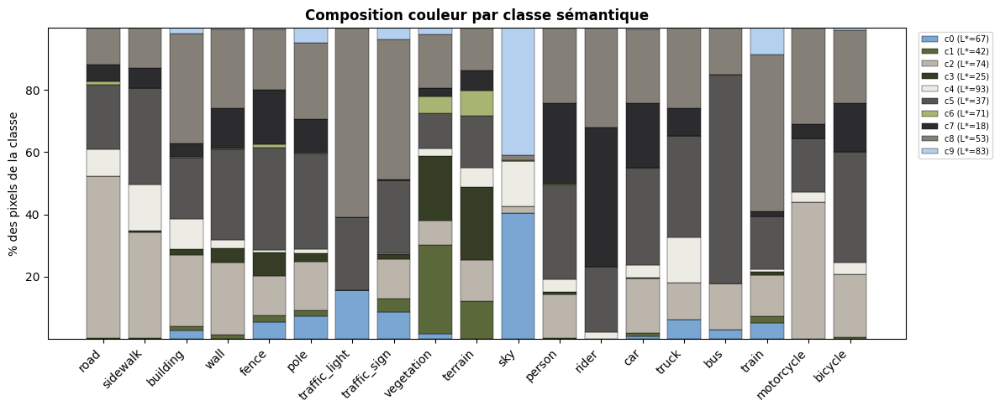

In [6]:
cross = np.zeros((19, N_COLORS), dtype=np.int64)
for p in image_paths:
    f = SLIC_DIR / f"{p.stem}_slic.png"
    if not f.exists():
        continue
    col = cv2.imread(str(f), cv2.IMREAD_GRAYSCALE)
    sem = load_sem(p.stem)
    if sem is None or sem.shape != col.shape:
        continue
    v = sem != 255
    cross += np.bincount(sem[v].astype(np.int64) * N_COLORS + col[v],
                         minlength=19 * N_COLORS).reshape(19, N_COLORS)

cross_pct = cross / np.maximum(cross.sum(axis=1, keepdims=True), 1) * 100
df_cross = pd.DataFrame(cross_pct.round(1), index=CITYSCAPES_ORDER,
                        columns=[f"c{i}" for i in range(N_COLORS)])
df_cross.to_csv(OUTPUT_DIR / "crosstab_couleur_semantique.csv")

print("=== Distribution des couleurs par classe (%) ===")
present = [c for c in range(19) if cross[c].sum() > 0]
print(df_cross.iloc[present].to_string())

# Clarte moyenne (L*) ponderee par classe -> proxy direct de l'albedo
L_star = palette_lab[:, 0]
clarte = (cross_pct @ L_star) / 100
df_clarte = pd.DataFrame({"classe": CITYSCAPES_ORDER, "L*_moyen": clarte.round(1),
                          "pixels": cross.sum(axis=1)})
df_clarte = df_clarte[df_clarte["pixels"] > 0].sort_values("L*_moyen", ascending=False)
print("\n=== Clarte moyenne L* par classe (0=noir, 100=blanc) ===")
print(df_clarte.to_string(index=False))
df_clarte.to_csv(OUTPUT_DIR / "clarte_par_classe.csv", index=False)

fig, ax = plt.subplots(figsize=(12, 5))
bottom = np.zeros(len(present))
for c in range(N_COLORS):
    ax.bar([CITYSCAPES_ORDER[i] for i in present], cross_pct[present, c],
           bottom=bottom, color=palette_rgb[c] / 255.0, edgecolor="black", linewidth=0.3,
           label=f"c{c} (L*={palette_lab[c,0]:.0f})")
    bottom += cross_pct[present, c]
ax.set_ylabel("% des pixels de la classe")
ax.set_title("Composition couleur par classe sémantique", fontweight="bold")
ax.legend(bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=7)
plt.xticks(rotation=45, ha="right"); plt.tight_layout()
fig.savefig(OUTPUT_DIR / "couleur_par_classe.png", dpi=150); plt.show()

## 7. Visualisation

Original | segmentation K-means (par pixel) | segmentation SLIC (régions cohérentes).

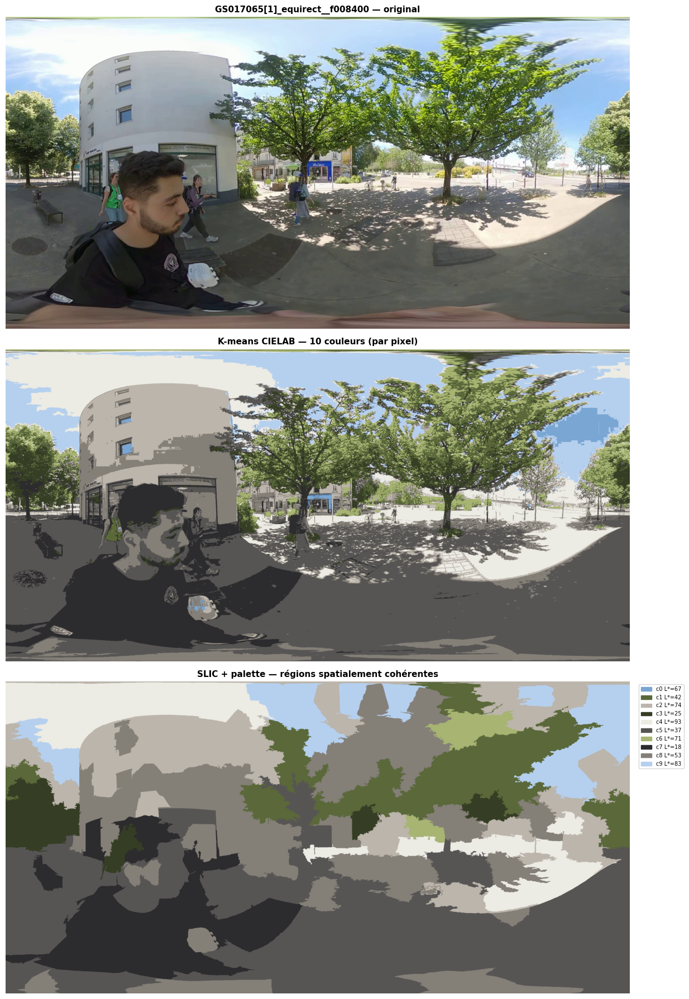

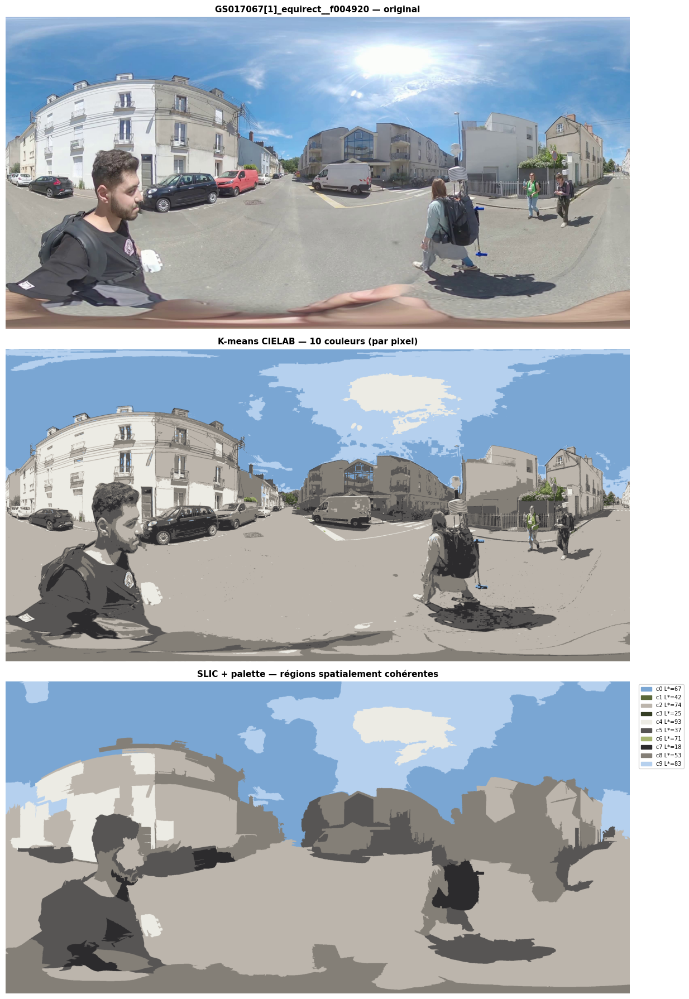

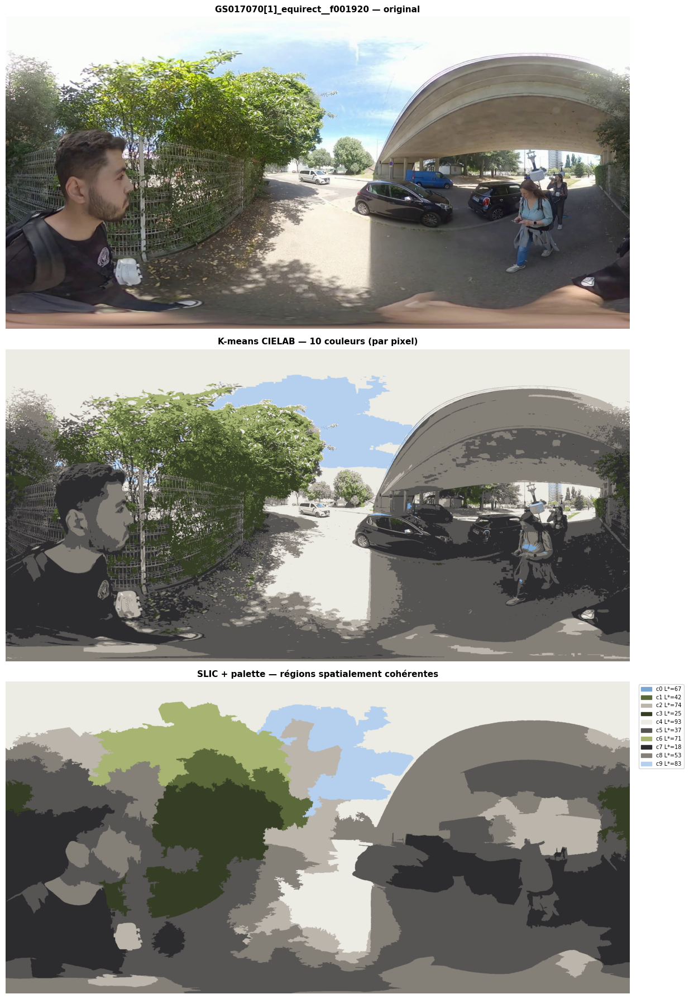

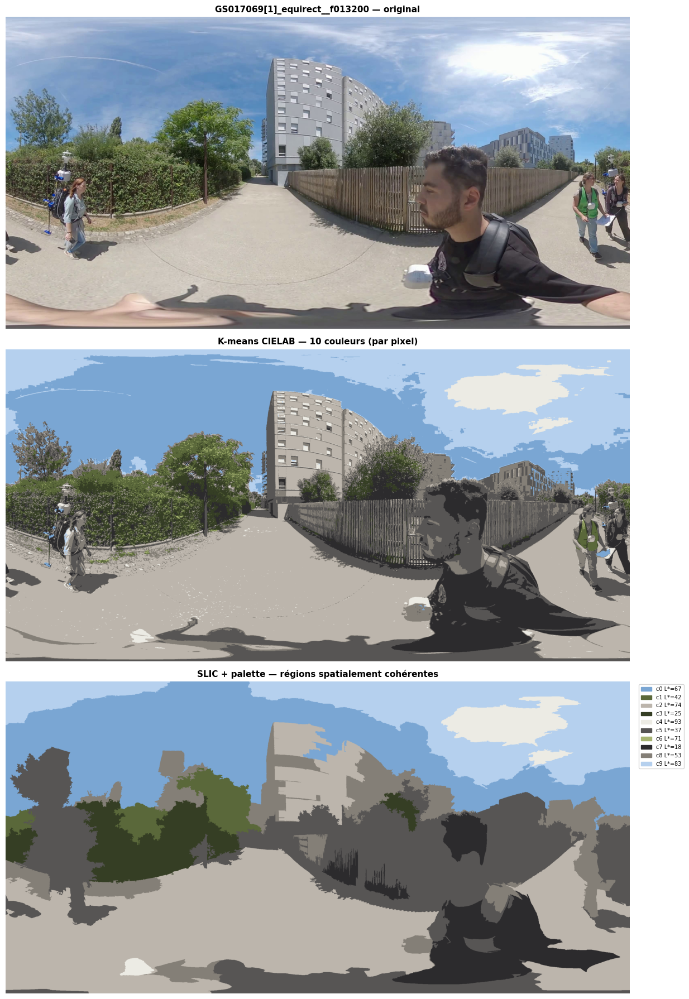

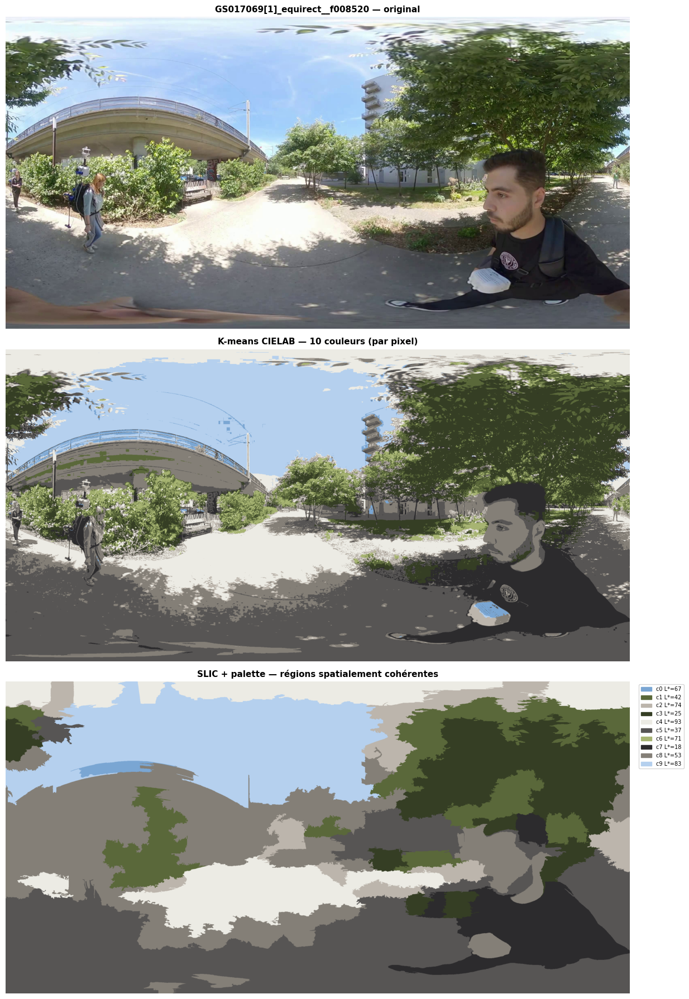

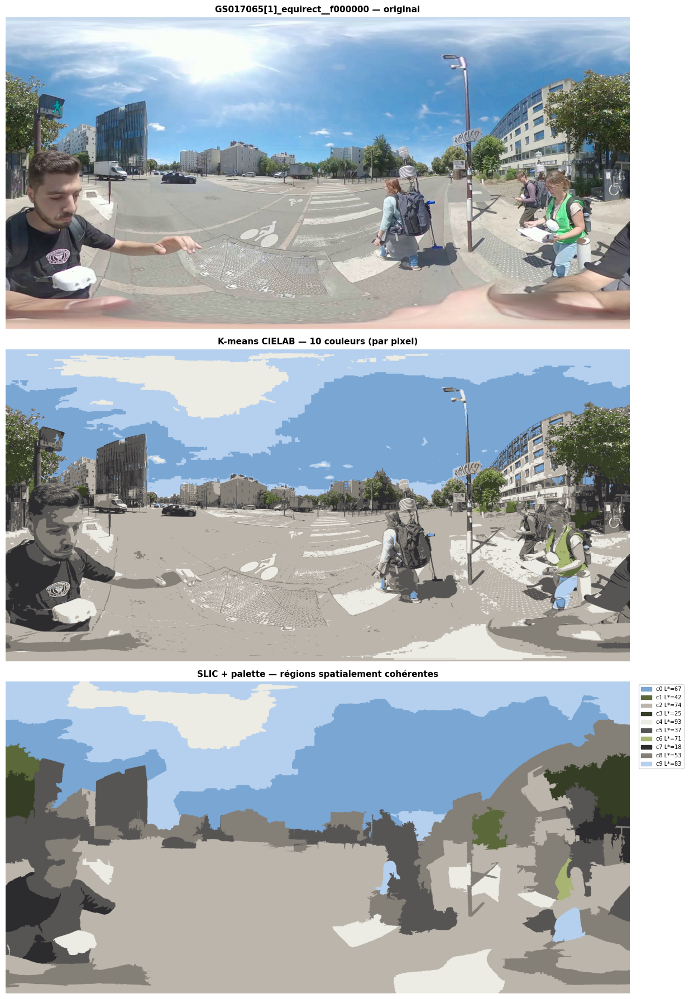

Visualisations : C:\Users\youss\Downloads\coolpath_local\data\outputs\color_segmentation\viz


In [7]:
for p in random.Random(1).sample(image_paths, min(6, len(image_paths))):
    f_km, f_sl = KMEANS_DIR / f"{p.stem}_km.png", SLIC_DIR / f"{p.stem}_slic.png"
    if not (f_km.exists() and f_sl.exists()):
        continue
    rgb = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
    km_map = cv2.imread(str(f_km), cv2.IMREAD_GRAYSCALE)
    sl_map = cv2.imread(str(f_sl), cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(3, 1, figsize=(14, 18))
    axes[0].imshow(rgb)
    axes[0].set_title(f"{p.stem} — original", fontweight="bold", fontsize=11)
    axes[1].imshow(palette_rgb[km_map])
    axes[1].set_title(f"K-means CIELAB — {N_COLORS} couleurs (par pixel)",
                      fontweight="bold", fontsize=11)
    axes[2].imshow(palette_rgb[sl_map])
    axes[2].set_title(f"SLIC + palette — régions spatialement cohérentes",
                      fontweight="bold", fontsize=11)

    used = sorted(set(np.unique(km_map)) | set(np.unique(sl_map)))
    axes[2].legend(handles=[Patch(color=palette_rgb[c] / 255.0,
                                  label=f"c{c} L*={palette_lab[c,0]:.0f}") for c in used],
                   bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=7)
    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_DIR / f"{p.stem}_color.png", dpi=95, bbox_inches="tight")
    plt.show()

print(f"Visualisations : {VIZ_DIR}")

## 8. Intégration dans le notebook 25

Pour utiliser la **clarté du cluster couleur** au lieu de la luminance brute par pixel, remplacer `load_color` dans le nb25 par :

```python
COLOR_DIR = PROJECT_ROOT / "data" / "outputs" / "color_segmentation"
palette_lab = pd.read_csv(COLOR_DIR / "palette_globale.csv").sort_values("cluster")[["L*","a*","b*"]].values
SLIC_DIR = COLOR_DIR / "masks_slic"

def load_color(p):
    # Retourne (image RGB, luminance issue de la SEGMENTATION couleur, 0-255)
    rgb = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
    col = cv2.imread(str(SLIC_DIR / f"{p.stem}_slic.png"), cv2.IMREAD_GRAYSCALE)
    lum = palette_lab[col, 0] / 100.0 * 255.0     # L* du cluster -> 0-255
    return rgb, lum
```

**Différence avec la v1 du nb25** : la luminance ne vient plus du pixel isolé (bruitée, sensible au grain et aux reflets ponctuels) mais de la **couleur moyenne de la région** à laquelle il appartient — plus stable, et comparable d'une image à l'autre puisque la palette est globale.

## 9. Limites à discuter avec les encadrants

1. **Les ombres ne sont pas retirées.** Un trottoir clair à l'ombre sera classé dans un cluster sombre. C'est la limite fondamentale de toute méthode travaillant directement sur les pixels — pour la corriger il faudrait une décomposition intrinsèque (albédo/shading), qui est un autre problème.
2. **Le choix de N est un compromis**, pas une valeur optimale absolue : la silhouette et le coude (section 3) orientent, mais l'interprétabilité compte autant. Justifier le choix retenu dans le rapport.
3. **La palette dépend du dataset** : apprise sur ces 116 images (quartier Dalby, conditions estivales ensoleillées). Elle ne se transpose pas telle quelle à d'autres quartiers ou saisons — il faudrait la réapprendre.
4. **CIELAB suppose un blanc de référence** (D65 par défaut dans skimage). Les images GoPro ont une balance des blancs automatique non contrôlée → les valeurs `a*`/`b*` absolues sont à manier avec prudence ; `L*` est plus robuste.
5. **SLIC : les paramètres `n_segments` et `compactness`** ont été fixés à 400 / 10.0 (valeurs usuelles). Ils influencent la granularité des régions — à ajuster si les résultats visuels ne conviennent pas.